In [9]:
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style="whitegrid", context="notebook",font_scale=1.2)
import pandas as pd
# disable setting with copy warning
pd.options.mode.chained_assignment = None
import numpy as np
import os
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)
import matplotlib.pyplot as plt
import pydicom

In [10]:
PV = "age"
if PV == "age":
    groups = ["old", "young"]
else:
    groups = ["male", "female"]
metrics = (f"test/{groups[0]}_subgroupAUROC", f"test/{groups[1]}_subgroupAUROC", "subgroupAUROC")

In [11]:
def load_csvs_into_df(dir):
    dirs = [os.path.join(dir,d) for d in os.listdir(dir) if os.path.isdir(os.path.join(dir,d))]
    dfs = []
    sample_dfs = []
    for d in dirs:
        seeds = [f for f in os.listdir(os.path.join('./',d)) if f.startswith('seed')]
        # get last number from directory name
        train_loader_num = int(d.split('_')[-1])
        for seed in seeds:
            results = [f for f in os.listdir(os.path.join(d,seed)) if f.startswith('test_results')][0]
            sample_info = [f for f in os.listdir(os.path.join(d,seed)) if f.startswith('train_loader')][0]
            results_df = pd.read_csv(os.path.join(d, seed, results))
            sample_df = pd.read_csv(os.path.join(d, seed, sample_info))
            results_df["train_loader_num"] = train_loader_num
            sample_df["train_loader_num"] = train_loader_num
            dfs.append(results_df)
            sample_dfs.append(sample_df)
    return pd.concat(dfs, ignore_index=True), pd.concat(sample_dfs, ignore_index=True)

In [12]:
df_1, df_samples_1 = load_csvs_into_df('./2023-10-28 18:24:29-FAE-cxr14-age-bs32-dataset-distillation-nsamples1-noDP')
df_1["num_samples"] = 1
df_samples_1["num_samples"] = 1
df_5, df_samples_5 = load_csvs_into_df('./2023-10-29 21:39:02-FAE-cxr14-age-bs32-dataset-distillation-nsamples5-noDP')
df_5["num_samples"] = 5
df_samples_5["num_samples"] = 5
df_10, df_samples_10 = load_csvs_into_df('./2023-10-30 20:54:29-FAE-cxr14-age-bs32-dataset-distillation-nsamples10-noDP')
df_10["num_samples"] = 10
df_samples_10["num_samples"] = 10
df_15, df_samples_15 = load_csvs_into_df('./2023-10-31 00:31:38-FAE-cxr14-age-bs32-dataset-distillation-nsamples15-noDP')
df_15["num_samples"] = 15
df_samples_15["num_samples"] = 15

In [13]:
# combine the dfs
df = pd.concat([df_1,df_5,df_10,df_15], axis=0)
df_samples = pd.concat([df_samples_1,df_samples_5,df_samples_10,df_samples_15], axis=0)

In [14]:
df = df[['seed','protected_attr_percent',metrics[0],metrics[1],'num_samples','train_loader_num']]
df = pd.melt(df, id_vars=['seed','protected_attr_percent','num_samples','train_loader_num'], var_name="metric")
df.metric = df.metric.str.replace(metrics[1],groups[1])
df.metric = df.metric.str.replace(metrics[0],groups[0])
df.head()

,seed,protected_attr_percent,num_samples,train_loader_num,metric,value
0,1,0.5,1,1068,old,0.493872
1,1,0.5,1,1071,old,0.493872
2,1,0.5,1,502,old,0.480730
3,1,0.5,1,1218,old,0.493872
4,1,0.5,1,201,old,0.493872


Text(0.5, 1.0, 'FAE on CXR14 - Age - Dataset Distillation')

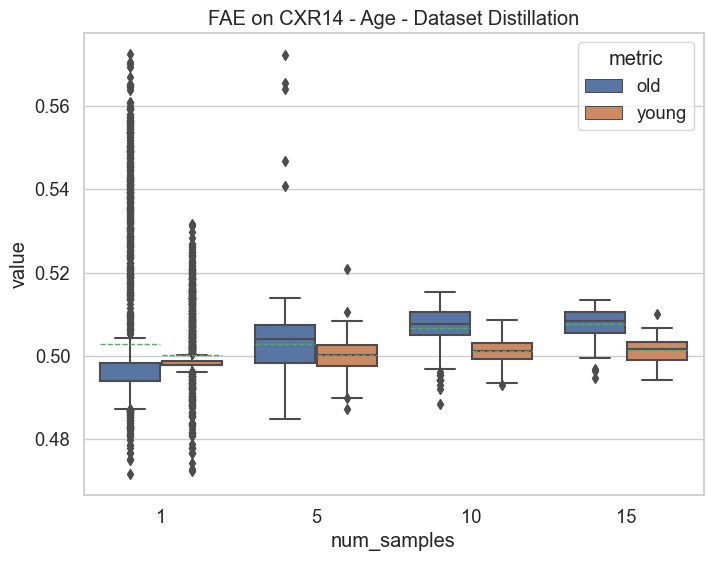

In [15]:
plt.figure(figsize=(8,6))
g = sns.boxplot(data=df, x="num_samples", y="value", hue="metric", meanline=True, showmeans=True)
g.set_title("FAE on CXR14 - Age - Dataset Distillation")

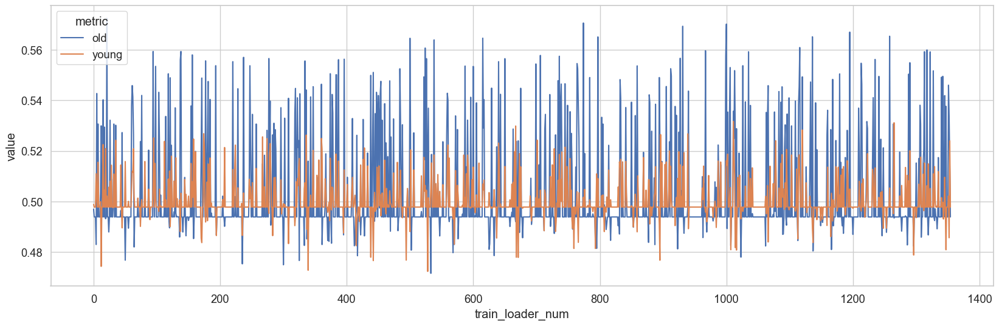

In [16]:
plt.figure(figsize=(20,6))
sub = df.loc[df.num_samples == 1]
sns.lineplot(data=sub, x="train_loader_num", y="value", hue="metric");
# also draw mean lines
plt.axhline(y=sub.loc[sub.metric==f"test/{groups[0]}_subgroupAUROC"].value.mean(), linestyle='--')
plt.axhline(y=sub.loc[sub.metric==f"test/{groups[1]}_subgroupAUROC"].value.mean(), color="orange",linestyle='--')

In [17]:
def get_best_and_worst(d, d_samples, group=0):
    best = d[["train_loader_num",f"test/{groups[group]}_subgroupAUROC"]].sort_values(by=f"test/{groups[group]}_subgroupAUROC", ascending=False).iloc[:5]
    best.rename(columns={f"test/{groups[group]}_subgroupAUROC":"value"}, inplace=True)
    best.sort_values(by="train_loader_num", ascending=True, inplace=True)
    best_samples = d_samples.loc[d_samples["train_loader_num"].isin(best["train_loader_num"].values)]
    best_samples.sort_values(by="train_loader_num", ascending=True, inplace=True)
    
    worst = d[["train_loader_num",f"test/{groups[group]}_subgroupAUROC"]].sort_values(by=f"test/{groups[group]}_subgroupAUROC", ascending=True).iloc[:5]
    worst.rename(columns={f"test/{groups[group]}_subgroupAUROC":"value"}, inplace=True)
    worst.sort_values(by="train_loader_num", ascending=True, inplace=True)
    worst_samples = d_samples.loc[d_samples["train_loader_num"].isin(worst["train_loader_num"].values)]
    worst_samples.sort_values(by="train_loader_num", ascending=True, inplace=True)
    return best, best_samples, worst, worst_samples

In [18]:
def plot_xrays(d, d_samples, num_imgs=5, group=0, title_prefix=""):
    fig, axs = plt.subplots(1, num_imgs, figsize=(5*num_imgs,num_imgs))
    for i in range(0,num_imgs):
        file_path = d_samples["filenames"].values[i]
        file_path = "remote_data/nih_cxr8/" + "/".join(file_path.split("/")[2:])
        file_path = "../../../" + file_path
        # read png file and add to axs[i]
        img = plt.imread(file_path)
        axs[i].imshow(img, cmap="gray")
        # add score as title
        score = d["value"].values[i] if len(d) > 1 else d["value"].values[0]
        axs[i].set_title(f"{title_prefix} {groups[group]} score: {score:.4f}")
        axs[i].grid(False)

In [19]:
def subset_by_trainloader(d,d_samples, train_loader_idx=0):
    chosen_train_loader_num = d.iloc[train_loader_idx]["train_loader_num"]
    d_samples = d_samples.loc[d_samples["train_loader_num"]==chosen_train_loader_num]
    d = d.loc[d["train_loader_num"]==chosen_train_loader_num]
    return d, d_samples

# Details num_samples=1

      train_loader_num     value
369                174  0.526824
276                667  0.529840
260               1011  0.531676
724               1120  0.528284
1221              1265  0.531140


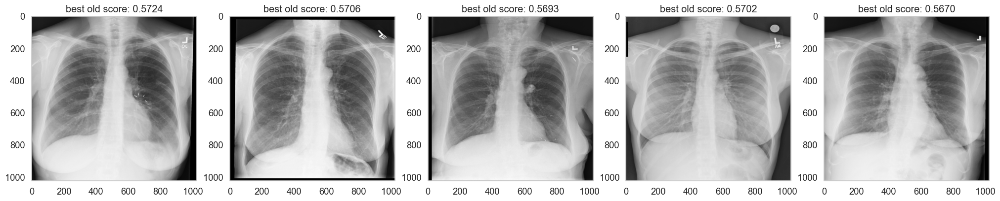

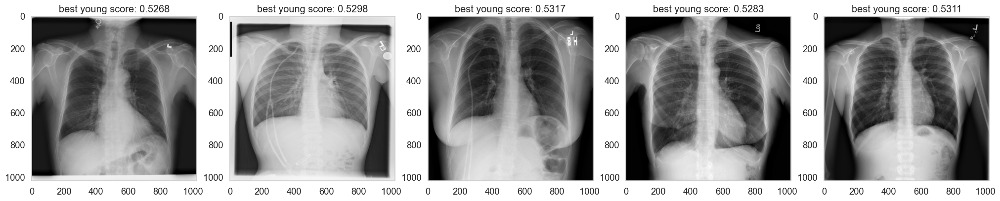

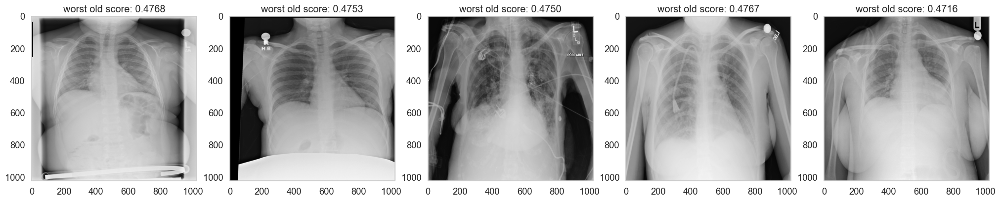

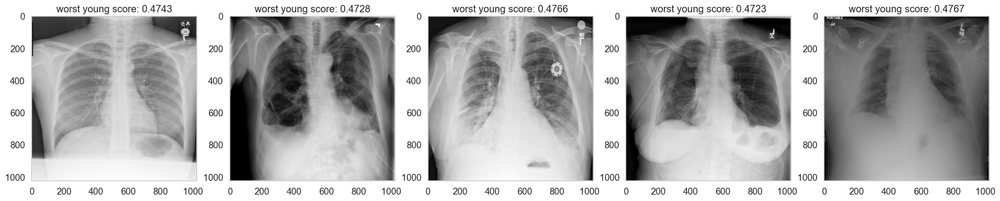

In [21]:
best_old, best_old_samples, worst_old, worst_old_samples = get_best_and_worst(df_1, df_samples_1, group=0)
best_young, best_young_samples, worst_young, worst_young_samples = get_best_and_worst(df_1, df_samples_1, group=1)
print(best_young)
plot_xrays(best_old, best_old_samples, group=0, title_prefix="best")
plot_xrays(best_young, best_young_samples, group=1, title_prefix="best")
plot_xrays(worst_old, worst_old_samples, group=0, title_prefix="worst")
plot_xrays(worst_young, worst_young_samples, group=1, title_prefix="worst")

# Details num_samples=5


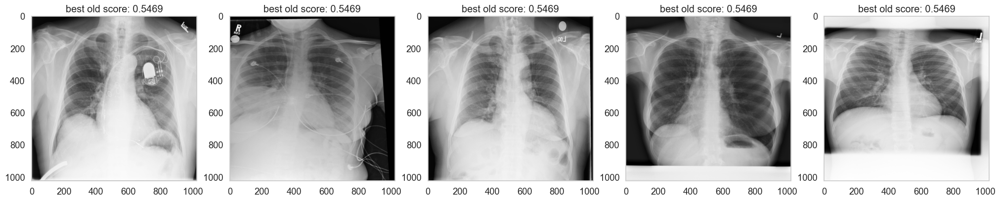

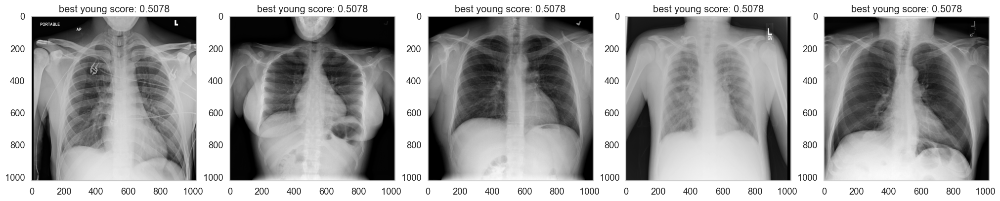

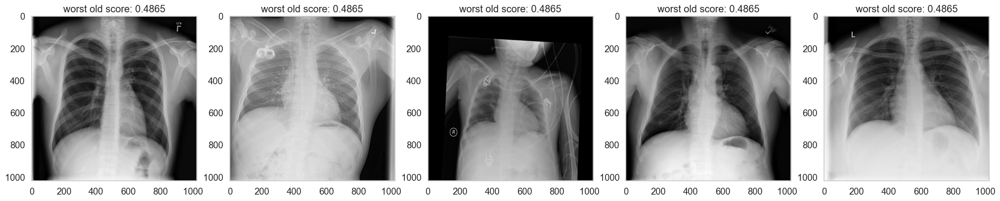

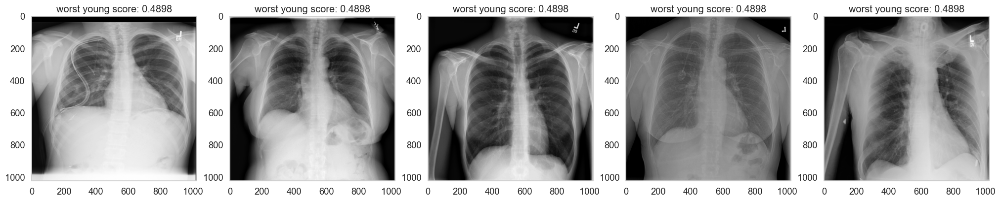

In [22]:
train_loader_idx = 2
best_old, best_old_samples, worst_old, worst_old_samples = get_best_and_worst(df_5, df_samples_5, group=0)
best_young, best_young_samples, worst_young, worst_young_samples = get_best_and_worst(df_5, df_samples_5, group=1)

best_old, best_old_samples = subset_by_trainloader(best_old, best_old_samples, train_loader_idx=train_loader_idx)
worst_old, worst_old_samples = subset_by_trainloader(worst_old, worst_old_samples, train_loader_idx=train_loader_idx)
best_young, best_young_samples = subset_by_trainloader(best_young, best_young_samples, train_loader_idx=train_loader_idx)
worst_young, worst_young_samples = subset_by_trainloader(worst_young, worst_young_samples, train_loader_idx=train_loader_idx)

plot_xrays(best_old, best_old_samples, group=0, title_prefix="best")
plot_xrays(best_young, best_young_samples, group=1, title_prefix="best")
plot_xrays(worst_old, worst_old_samples, group=0, title_prefix="worst")
plot_xrays(worst_young, worst_young_samples, group=1, title_prefix="worst")

# Details num_samples=10


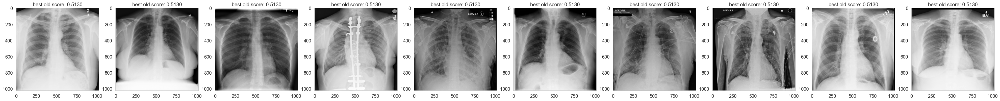

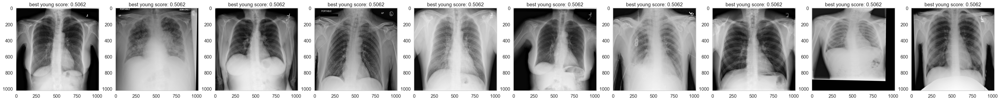

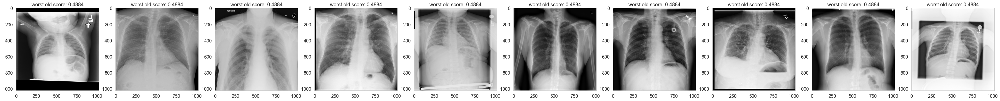

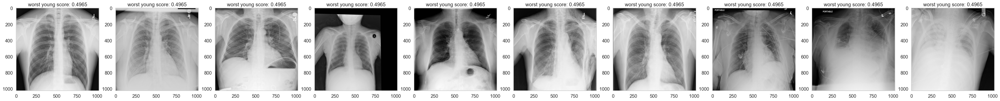

In [23]:
train_loader_idx = 0
best_old, best_old_samples, worst_old, worst_old_samples = get_best_and_worst(df_10, df_samples_10, group=0)
best_young, best_young_samples, worst_young, worst_young_samples = get_best_and_worst(df_10, df_samples_10, group=1)

best_old, best_old_samples = subset_by_trainloader(best_old, best_old_samples, train_loader_idx=train_loader_idx)
worst_old, worst_old_samples = subset_by_trainloader(worst_old, worst_old_samples, train_loader_idx=train_loader_idx)
best_young, best_young_samples = subset_by_trainloader(best_young, best_young_samples, train_loader_idx=train_loader_idx)
worst_young, worst_young_samples = subset_by_trainloader(worst_young, worst_young_samples, train_loader_idx=train_loader_idx)

plot_xrays(best_old, best_old_samples, group=0, title_prefix="best", num_imgs=10)
plot_xrays(best_young, best_young_samples, group=1, title_prefix="best", num_imgs=10)
plot_xrays(worst_old, worst_old_samples, group=0, title_prefix="worst", num_imgs=10)
plot_xrays(worst_young, worst_young_samples, group=1, title_prefix="worst", num_imgs=10)

# Details num_samples=15


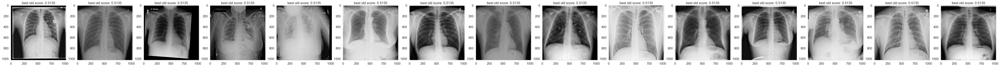

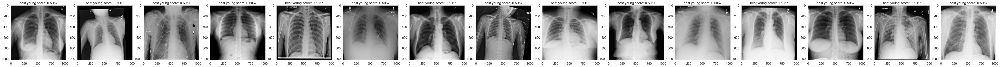

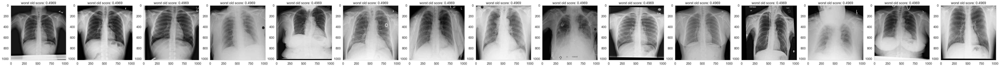

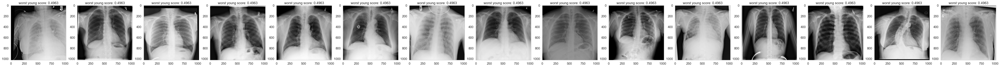

In [24]:
train_loader_idx = 0
best_old, best_old_samples, worst_old, worst_old_samples = get_best_and_worst(df_15, df_samples_15, group=0)
best_young, best_young_samples, worst_young, worst_young_samples = get_best_and_worst(df_15, df_samples_15, group=1)

best_old, best_old_samples = subset_by_trainloader(best_old, best_old_samples, train_loader_idx=train_loader_idx)
worst_old, worst_old_samples = subset_by_trainloader(worst_old, worst_old_samples, train_loader_idx=train_loader_idx)
best_young, best_young_samples = subset_by_trainloader(best_young, best_young_samples, train_loader_idx=train_loader_idx)
worst_young, worst_young_samples = subset_by_trainloader(worst_young, worst_young_samples, train_loader_idx=train_loader_idx)

plot_xrays(best_old, best_old_samples, group=0, title_prefix="best", num_imgs=15)
plot_xrays(best_young, best_young_samples, group=1, title_prefix="best", num_imgs=15)
plot_xrays(worst_old, worst_old_samples, group=0, title_prefix="worst", num_imgs=15)
plot_xrays(worst_young, worst_young_samples, group=1, title_prefix="worst", num_imgs=15)